# Libraries
-----------

---



---



In [ ]:
!pip install scikeras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import zipfile
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
import cv2
import glob
from sklearn.preprocessing import OneHotEncoder, StandardScaler , LabelEncoder
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.model_selection import GridSearchCV
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import  accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
warnings.simplefilter(action='ignore', category=FutureWarning)
import joblib
# check tensorflow version as older ones may not work properly
import tensorflow as tf
print(tf.__version__)

# for kaggle submission, else skip this cell
zipfile.ZipFile("/content/train.csv.zip", 'r').extractall("/content")
zipfile.ZipFile("/content/test.csv.zip", 'r').extractall("/content")
# zipfile.ZipFile("/content/images.zip", 'r').extractall("/content/")

2.11.0


In [ ]:
pd.set_option("display.max.columns", None)#that’s probably more readable than wrapping long rows
pd.set_option("display.max_rows", None)

# Read Data
___________________________________
_________________________________

In [ ]:
train_data = pd.read_csv("/content/train.csv")
test_data = pd.read_csv("/content/test.csv")
print("Shape of train data : ",train_data.shape )
print("Shape of test data : ",test_data.shape )
train_data.head()

Shape of train data :  (990, 194)
Shape of test data :  (594, 193)


,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,0.033203,0.013672,0.019531,0.066406,0.000000,0.029297,0.0,0.031250,0.011719,0.000000,0.025391,0.023438,0.001953,0.0,0.015625,0.000000,0.031250,0.000000,0.013672,0.029297,0.015625,0.011719,0.003906,0.025391,0.000000,0.001953,0.011719,0.009766,0.041016,0.037109,0.019531,0.000000,0.009766,0.021484,0.015625,0.007812,0.013672,0.027344,0.062500,0.000000,0.017578,0.031250,0.0,0.044922,0.007812,0.025391,0.003906,0.013672,0.015625,0.013672,0.003906,0.005859,0.003906,0.019531,0.001953,0.000647,0.000609,0.000576,0.000553,0.000516,0.000496,0.000474,0.000453,0.000454,0.000429,0.000418,0.000410,0.000406,0.000398,0.000399,0.000389,0.000399,0.000416,0.000414,0.000430,0.000422,0.000437,0.000452,0.000467,0.000470,0.000484,0.000489,0.000490,0.000475,0.000486,0.000484,0.000500,0.000513,0.000511,0.000519,0.000513,0.000502,0.000498,0.000487,0.000471,0.000458,0.000440,0.000436,0.000427,0.000394,0.000385,0.000382,0.000370,0.000367,0.000373,0.000386,0.000389,0.000391,0.000414,0.000422,0.000434,0.000452,0.000471,0.000485,0.000512,0.000536,0.000553,0.000610,0.000660,0.049805,0.017578,0.003906,0.024414,0.001953,0.010742,0.035156,0.007812,0.039062,0.062500,0.000000,0.000000,0.007812,0.007812,0.0,0.0,0.047852,0.0,0.054688,0.022461,0.0,0.000977,0.018555,0.001953,0.008789,0.015625,0.044922,0.000000,0.037109,0.012695,0.028320,0.000000,0.019531,0.026367,0.005859,0.0,0.004883,0.016602,0.034180,0.056641,0.006836,0.000977,0.022461,0.037109,0.004883,0.021484,0.035156,0.000977,0.004883,0.015625,0.000000,0.0,0.006836,0.037109,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,0.007812,0.003906,0.027344,0.023438,0.000000,0.033203,0.0,0.009766,0.009766,0.007812,0.007812,0.019531,0.007812,0.0,0.000000,0.007812,0.027344,0.003906,0.037109,0.007812,0.048828,0.054688,0.027344,0.003906,0.000000,0.000000,0.003906,0.013672,0.033203,0.033203,0.019531,0.031250,0.009766,0.007812,0.031250,0.001953,0.039062,0.029297,0.031250,0.035156,0.000000,0.007812,0.0,0.046875,0.046875,0.029297,0.009766,0.017578,0.007812,0.013672,0.019531,0.000000,0.000000,0.003906,0.000000,0.000749,0.000695,0.0

# Visualize - Draw Images
--------------------
--------------------

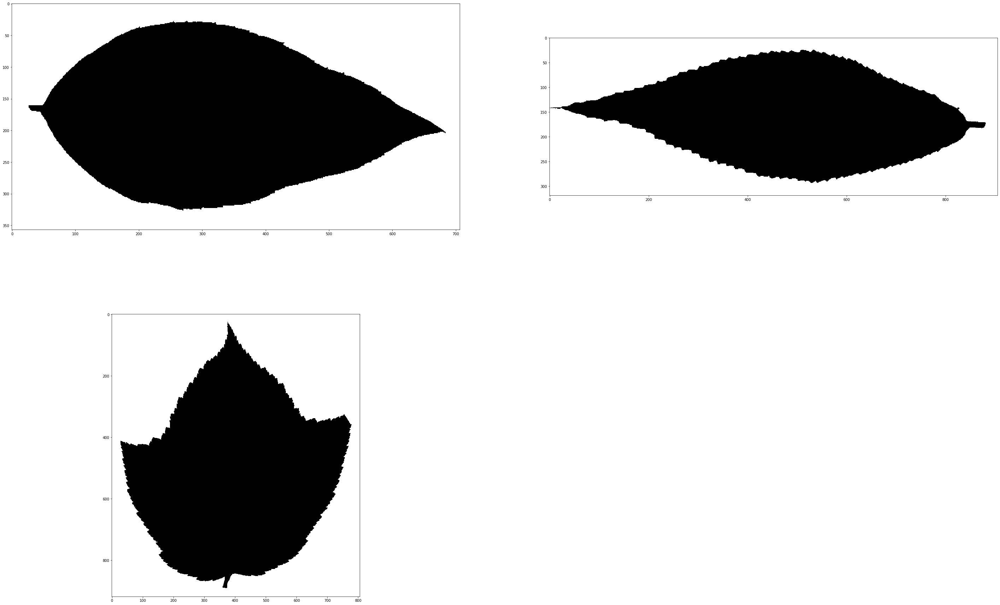

In [ ]:
images = []
images_file = glob.glob ("images/*.jpg")
for img in images_file:
    image = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
    images.append(image)

plt.figure()
plt.rcParams["figure.figsize"] = (50,50) # Custom figure size in inches
plt.subplot(3,2,1)
plt.imshow(images[17],cmap=plt.cm.gray_r, interpolation='nearest')

plt.subplot(3,2,2)

plt.imshow(images[27],cmap=plt.cm.gray_r, interpolation='nearest')

plt.subplot(3,2,3)

plt.imshow(images[7],cmap=plt.cm.gray_r, interpolation='nearest')

# Describe Data
-----------------------
-------------------------

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Columns: 194 entries, id to texture64
dtypes: float64(192), int64(1), object(1)
memory usage: 1.5+ MB


**Observations**


There is no categrical features in our data. all our features are numerical

In [ ]:
train_data.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,0.018639,0.024209,0.011975,0.041252,0.008053,0.015609,0.000110,0.0151

# Visualize Distribution Data
---------------------
---------------------------

# Let's see the distribution of the data

In [ ]:
pd.DataFrame(xTrain).describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000
mean,0.017704,0.029174,0.031134,0.023447,0.014296,0.039349,0.019312,0.001127,0.007260,0.018890,0.023926,0.012042,0.040966,0.008168,0.015521,0.000118,0.015151,0.019568,0.012350,0.013151,0.019033,0.006296,0.000972,0.007741,0.009023,0.018634,0.005775,0.015361,0.028278,0.016365,0.010991,0.010012,0.019499,0.001080,0.013524,0.018456,0.016005,0.031008,0.014646,0.008111,0.010811,0.017553,0.018456,0.012700,0.024209,0.010076,0.025270,0.026658,0.008750,0.013909,0.026209,0.002925,0.023985,0.009946,0.017992,0.005874,0.012404,0.019973,0.030564,0.011896,0.001374,0.005107,0.025319,0.004572,0.021582,0.011668,0.010451,0.015461,0.026860,0.009631,0.016946,0.019534,0.015086,0.020147,0.018386,0.027180,0.009731,0.013234,0.011618,0.004541,0.014851,0.006274,0.025163,0.014594,0.003033,0.013455,0.017010,0.010036,0.010349,0.022208,0.020312,0.010501,0.022033,0.011795,0.024325,0.006260,0.023013,0.026396,0.010678,0.003404,0.020631,0.023262,0.017528,0.019759,0.015912,0.005968,0.013863,0.025010,0.015651,0.021526,0.018827,0.017529,0.011827,0.019185,0.012846,0.007327,0.014406,0.022857,0.036195,0.005195,0.015180,0.011176,0.016566,0.013235,0.002915,0.019477,0.009111,0.019293
std,0.019705,0.039627,0.024940,0.029131,0.018420,0.052923,0.017662,0.002881,0.009169,0.016558,0.025693,0.011891,0.044538,0.013474,0.014307,0.001037,0.010764,0.019758,0.014263,0.009715,0.019314,0.010544,0.004249,0.012891,0.012833,0

array([[<Axes: title={'center': 'margin1'}>,
        <Axes: title={'center': 'margin2'}>,
        <Axes: title={'center': 'margin3'}>,
        <Axes: title={'center': 'margin4'}>,
        <Axes: title={'center': 'margin5'}>,
        <Axes: title={'center': 'margin6'}>,
        <Axes: title={'center': 'margin7'}>,
        <Axes: title={'center': 'margin8'}>,
        <Axes: title={'center': 'margin9'}>,
        <Axes: title={'center': 'margin10'}>,
        <Axes: title={'center': 'margin11'}>,
        <Axes: title={'center': 'margin12'}>,
        <Axes: title={'center': 'margin13'}>,
        <Axes: title={'center': 'margin14'}>],
       [<Axes: title={'center': 'margin15'}>,
        <Axes: title={'center': 'margin16'}>,
        <Axes: title={'center': 'margin17'}>,
        <Axes: title={'center': 'margin18'}>,
        <Axes: title={'center': 'margin19'}>,
        <Axes: title={'center': 'margin20'}>,
        <Axes: title={'center': 'margin21'}>,
        <Axes: title={'center': 'margin22'

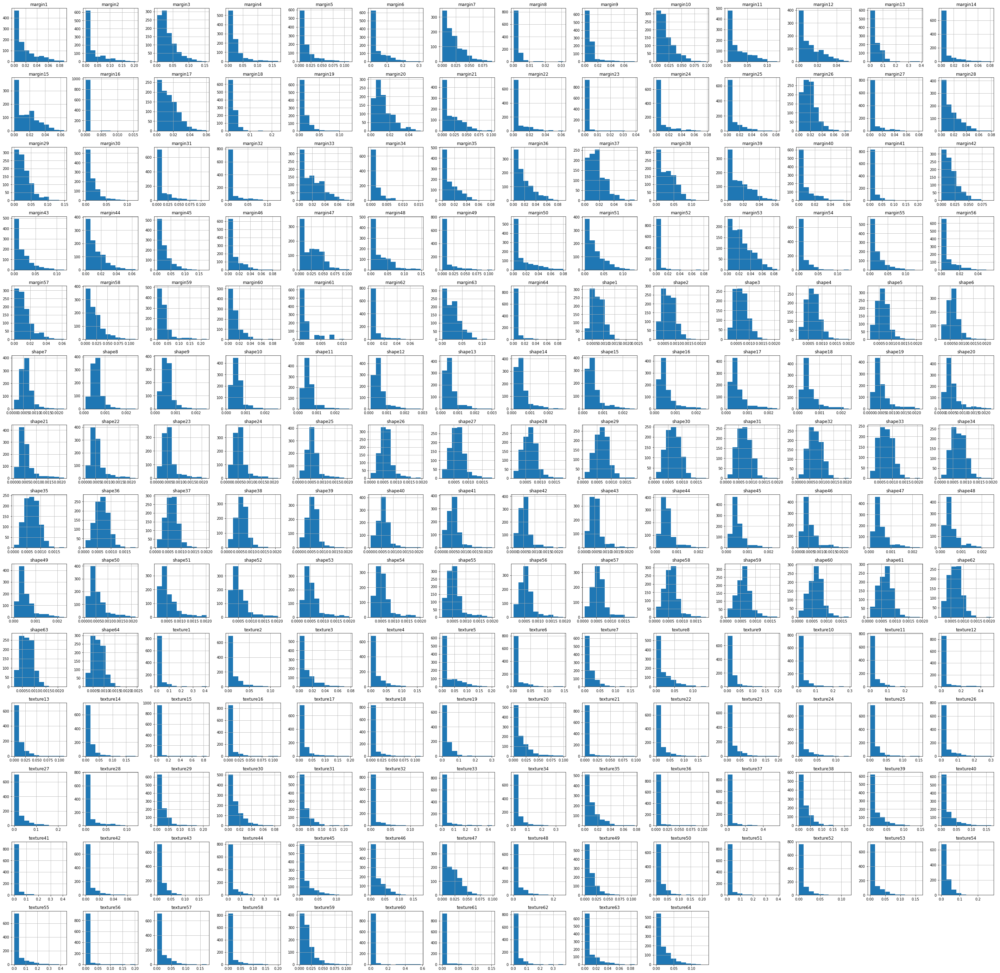

In [ ]:
plt.rcParams["figure.figsize"] = (50,50) # Custom figure size in inches
train_data.iloc[:,1:].hist()

# Helper Function

In [ ]:
class preprocessing:


    def __init__(self, dataframe):
        self.dataframe = dataframe


    #------------------------------- Check null ^_^ ------------------------------------
    '''
    This function counts null in each column in the dataframe and calculate the percent of nulls in the column then return the
    dataframe consist of 2 columns :  one contains count of null values in each column and second contains percent
    '''
    def null_values(self):
        null_val = pd.DataFrame(self.dataframe.isnull().sum())
        null_val.columns = ['null_val']
        null_val['percent_'] = round(null_val['null_val'] / len(self.dataframe.index), 2) * 100
        null_val = null_val.sort_values('percent_', ascending = False)
        return null_val
    #------------------------------- Check duplication ^_^  ------------------------------------
    '''
    This function counts duplicated rows in the dataframe
    '''
    def duplicated_values(self):
        return print("Number of duplicated rows" , self.dataframe.duplicated().sum())

    #------------------------------- CHECK CONSTANT FEATURES ^_^  ------------------------------------
    '''
    This function returns the columns that contain one value a cross all samples
    '''
    def constant_columns(self):
        constant_columns = [[col ,self.dataframe[col].value_counts()] for col in self.dataframe.columns if (self.dataframe[col].nunique()) == 1]
        return constant_columns

    #-------------------------------- Check the redundant_features ----------------------------------
    '''
    This Function check if there is a high correlation between 2 features .we set a thershold to 0.95. if any 2 features
    have a correlation larger than 0.95, put them in list .then return correlation matrix and list


    '''
    def redundant_features(self):
        #Creating the Correlation matrix
        cor_matrix = self.dataframe.corr().abs()
        #Select the upper triangular
        upper_tri =  pd.DataFrame(cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(bool)))
        #Select the columns which are having absolute correlation greater than 0.95 and making a list of those columns
        features_high_corr = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
        if len(features_high_corr) == 0 :
            print("There is no redundant features")
            print("*" * 50)
            return upper_tri
        else:
            return features_high_corr, upper_tri

    #--------------------------------------- cardinality ^_^ ---------------------------------------
    '''
    calculate unique values in each column and returns dataframe consists of count and percent. This helps us to find column that have
    high cardinality
    '''
    def cardinality(self):
        unique_val = pd.DataFrame(np.array([len(self.dataframe[col].unique()) for col in self.dataframe.columns ]) , index=self.dataframe.columns)
        unique_val.columns = ['unique_val']
        unique_val['percent_'] = round(unique_val['unique_val'] / len(self.dataframe.index), 2) * 100
        unique_val = unique_val.sort_values('percent_', ascending = False)
        return unique_val


     #--------------------------------------- list of columns that will be dropped , filled and values that fill null  ^_^ ---------------------------------------
    '''
    This function determines the columns that are highly correlated (corr >  95%) and
    columns that have cardinality more than or equal 99 % and combine them in list called to_drop(columns that we will drop).
    To do that, we call the previous functions
    '''
    def columns_to_drop(self):
        features_high_corr,df_corr = self.redundant_features()
        car_features = self.cardinality()
        car_features_col = car_features[car_features['percent_'] >= 99].index
        to_drop = list(set(car_features_col) | set(features_high_corr))
        return to_drop


     #--------------------------------------- drop columns  ^_^ ---------------------------------------
    '''
    This function drop columns we specified.we will use it to drop columns that we determined from columns_to_drop function
    '''

    def drop_col(self , cols):
        self.dataframe = self.dataframe.drop(cols, axis=1)
        return self.dataframe




In [ ]:
preprocess_steps_train = preprocessing(train_data)

In [ ]:
preprocess_steps_test = preprocessing(test_data)


# Explore Data
----
------------------

### Check nulls
-------------------
------------------------

In [ ]:
preprocess_steps_train.null_values()

,null_val,percent_
id,0,0.0
texture16,0,0.0
shape58,0,0.0
shape59,0,0.0
shape60,0,0.0
shape61,0,0.0
shape62,0,0.0
shape63,0,0.0
shape64,0,0.0
texture1,0,0.0


**Observation**


Thanks to Allah, There is no null values in our data

### Check Duplication
----------------
----------------------

In [ ]:
preprocess_steps_train.duplicated_values()

Number of duplicated rows 0


**Observation**


Thanks to Allah, There is no duplicated rows in our data

### Check Constant Features
----------------
----------------------

In [ ]:
preprocess_steps_train.constant_columns()

[]

**Observation**


Thanks to Allah, There is no constant features in our data

### Check Redundant Features
----------------
----------------

In [ ]:
features_high_corr, upper_tri = preprocess_steps_train.redundant_features()
print("Features that are correlated to each other " , features_high_corr)
print("Number of features that are redundant " , len(features_high_corr))

Features that are correlated to each other  ['shape2', 'shape3', 'shape4', 'shape5', 'shape6', 'shape7', 'shape8', 'shape9', 'shape10', 'shape11', 'shape12', 'shape13', 'shape14', 'shape15', 'shape16', 'shape17', 'shape18', 'shape19', 'shape20', 'shape21', 'shape22', 'shape23', 'shape24', 'shape25', 'shape26', 'shape27', 'shape28', 'shape29', 'shape30', 'shape31', 'shape32', 'shape33', 'shape34', 'shape35', 'shape36', 'shape37', 'shape38', 'shape39', 'shape40', 'shape41', 'shape42', 'shape43', 'shape44', 'shape45', 'shape46', 'shape47', 'shape48', 'shape49', 'shape50', 'shape51', 'shape52', 'shape53', 'shape54', 'shape55', 'shape56', 'shape57', 'shape58', 'shape59', 'shape60', 'shape61', 'shape62', 'shape63', 'shape64']
Number of features that are redundant  63


**Observation**


As you can see, There are about 63 columns are highly correlated. we will need to drop them later

### Check Cardinality
---------------------
-------------------

In [ ]:
preprocess_steps_train.cardinality()

,unique_val,percent_
id,990,100.0
shape57,987,100.0
shape50,986,100.0
shape12,986,100.0
shape52,986,100.0
shape54,986,100.0
shape43,988,100.0
shape36,986,100.0
shape7,986,100.0
shape61,986,100.0


**Observation**


As you can see, There are about 66 columns are highly cardinality . we will need to drop them (>99%) later

### Check Imbalance in classes
-------------------
-----------------------

['Acer_Capillipes' 'Acer_Circinatum' 'Acer_Mono' 'Acer_Opalus'
 'Acer_Palmatum' 'Acer_Pictum' 'Acer_Platanoids' 'Acer_Rubrum'
 'Acer_Rufinerve' 'Acer_Saccharinum' 'Alnus_Cordata' 'Alnus_Maximowiczii'
 'Alnus_Rubra' 'Alnus_Sieboldiana' 'Alnus_Viridis' 'Arundinaria_Simonii'
 'Betula_Austrosinensis' 'Betula_Pendula' 'Callicarpa_Bodinieri'
 'Castanea_Sativa' 'Celtis_Koraiensis' 'Cercis_Siliquastrum'
 'Cornus_Chinensis' 'Cornus_Controversa' 'Cornus_Macrophylla'
 'Cotinus_Coggygria' 'Crataegus_Monogyna' 'Cytisus_Battandieri'
 'Eucalyptus_Glaucescens' 'Eucalyptus_Neglecta' 'Eucalyptus_Urnigera'
 'Fagus_Sylvatica' 'Ginkgo_Biloba' 'Ilex_Aquifolium' 'Ilex_Cornuta'
 'Liquidambar_Styraciflua' 'Liriodendron_Tulipifera'
 'Lithocarpus_Cleistocarpus' 'Lithocarpus_Edulis' 'Magnolia_Heptapeta'
 'Magnolia_Salicifolia' 'Morus_Nigra' 'Olea_Europaea' 'Phildelphus'
 'Populus_Adenopoda' 'Populus_Grandidentata' 'Populus_Nigra'
 'Prunus_Avium' 'Prunus_X_Shmittii' 'Pterocarya_Stenoptera'
 'Quercus_Afares' 'Querc

<Axes: xlabel='species', ylabel='count'>

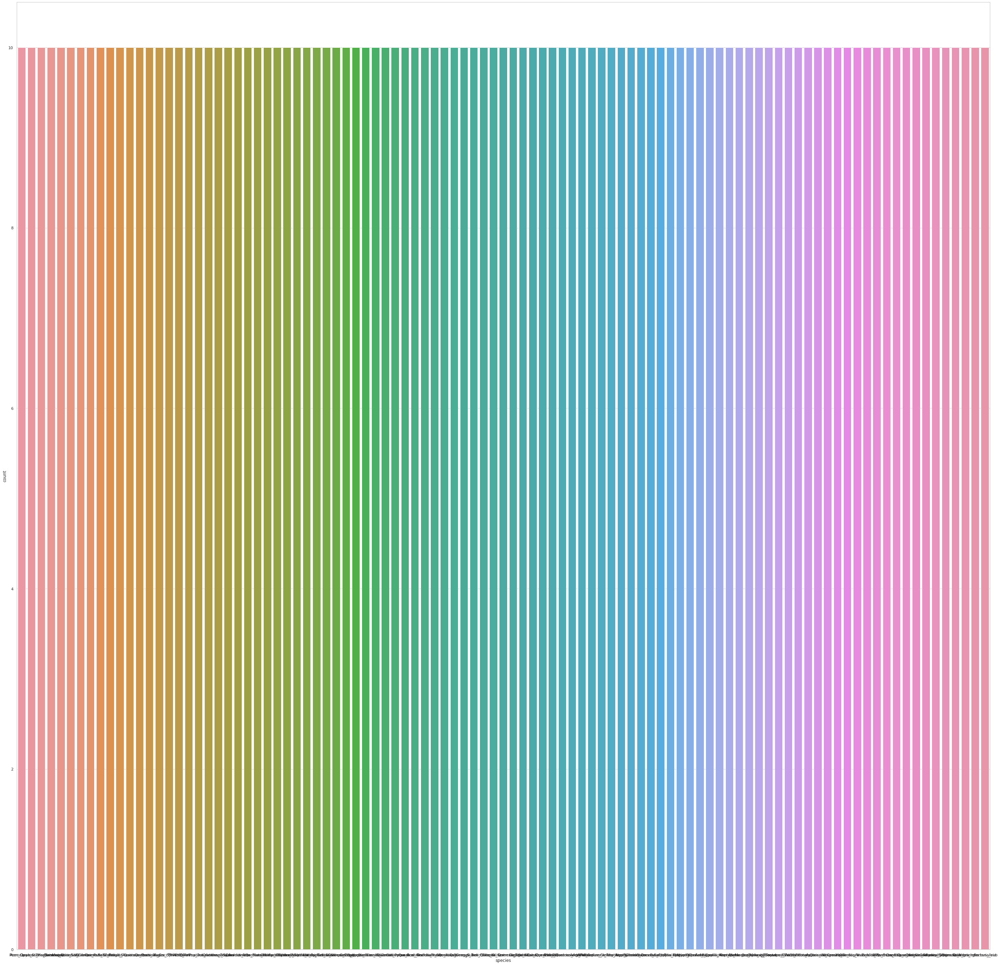

In [ ]:
classes ,count =  np.unique(train_data["species"],return_counts=True)
print(classes)
print(len(count))
sns.set_theme(style="whitegrid")
sns.countplot(data=train_data, x="species")

<Axes: >

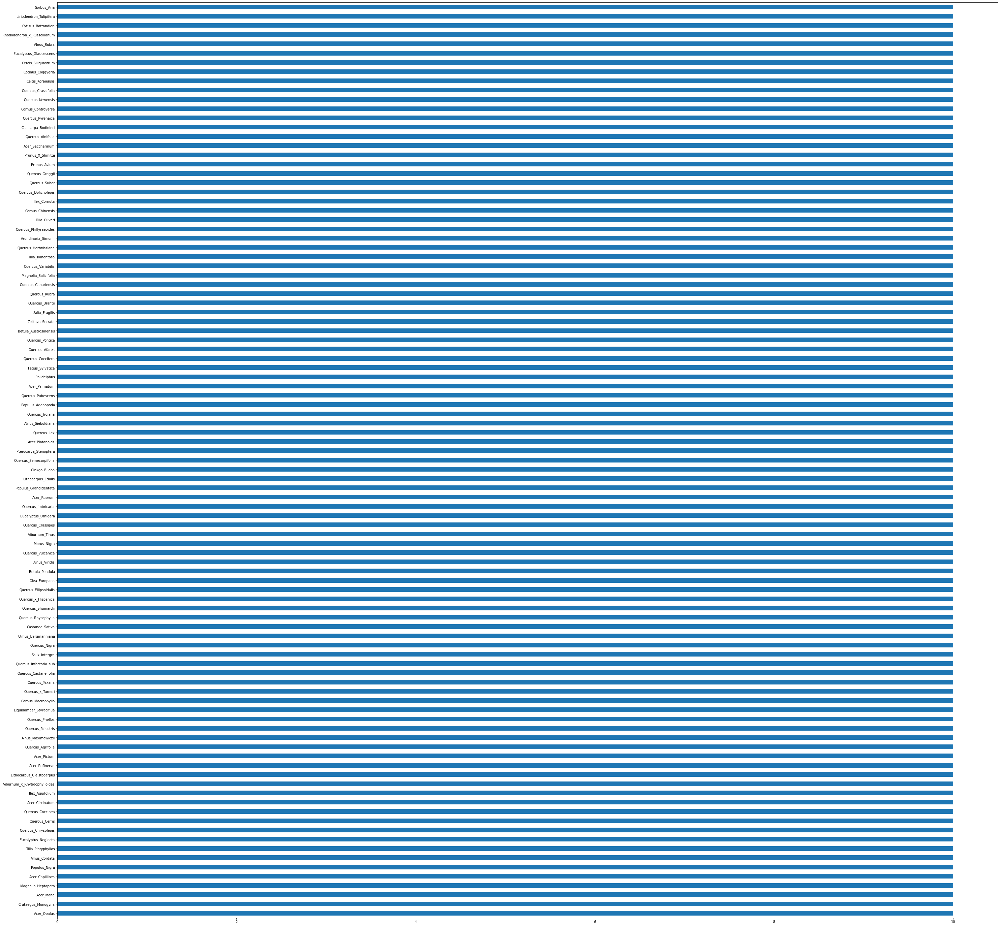

In [ ]:
train_data["species"].value_counts().plot(kind='barh')

**Observation**


As you can see, There are about 99 classes. all are balanced.

# Preprocessing Step
--------------------------
--------------------------

From the previous section, we know that we need to drop high cardinality columns and highly correlated features

In [ ]:
# Determine columns will be dropped
cols_to_drop  = preprocess_steps_train.columns_to_drop()

print("Columns that will be dropped ", cols_to_drop)
print("Number of Columns that will be dropped ", len(cols_to_drop))
# Drop columns
train_data_new  = preprocess_steps_train.drop_col(cols_to_drop)
print("Shape of data after dropping columns " , train_data_new.shape)
# show sample of data after dropping columns
train_data_new.head()

Columns that will be dropped  ['shape45', 'shape9', 'shape21', 'shape42', 'shape22', 'shape23', 'shape26', 'shape33', 'id', 'shape52', 'shape2', 'shape38', 'shape53', 'shape62', 'shape7', 'shape25', 'shape40', 'shape13', 'shape29', 'shape61', 'shape48', 'shape17', 'shape3', 'shape57', 'shape18', 'shape39', 'shape56', 'shape12', 'shape47', 'shape37', 'shape35', 'shape28', 'shape58', 'shape31', 'shape64', 'shape19', 'shape30', 'shape10', 'shape49', 'shape59', 'shape24', 'shape4', 'shape41', 'shape36', 'shape55', 'shape1', 'shape60', 'shape5', 'shape44', 'shape63', 'shape54', 'shape8', 'shape14', 'shape27', 'shape50', 'shape20', 'shape46', 'shape32', 'shape16', 'shape34', 'shape51', 'shape15', 'shape11', 'shape6', 'shape43']
Number of Columns that will be dropped  65
Shape of data after dropping columns  (990, 129)


,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,0.033203,0.013672,0.019531,0.066406,0.000000,0.029297,0.0,0.031250,0.011719,0.000000,0.025391,0.023438,0.001953,0.0,0.015625,0.000000,0.031250,0.000000,0.013672,0.029297,0.015625,0.011719,0.003906,0.025391,0.000000,0.001953,0.011719,0.009766,0.041016,0.037109,0.019531,0.000000,0.009766,0.021484,0.015625,0.007812,0.013672,0.027344,0.062500,0.000000,0.017578,0.031250,0.0,0.044922,0.007812,0.025391,0.003906,0.013672,0.015625,0.013672,0.003906,0.005859,0.003906,0.019531,0.001953,0.049805,0.017578,0.003906,0.024414,0.001953,0.010742,0.035156,0.007812,0.039062,0.062500,0.000000,0.000000,0.007812,0.007812,0.0,0.0,0.047852,0.0,0.054688,0.022461,0.0,0.000977,0.018555,0.001953,0.008789,0.015625,0.044922,0.000000,0.037109,0.012695,0.028320,0.000000,0.019531,0.026367,0.005859,0.0,0.004883,0.016602,0.034180,0.056641,0.006836,0.000977,0.022461,0.037109,0.004883,0.021484,0.035156,0.000977,0.004883,0.015625,0.000000,0.0,0.006836,0.037109,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,0.007812,0.003906,0.027344,0.023438,0.000000,0.033203,0.0,0.009766,0.009766,0.007812,0.007812,0.019531,0.007812,0.0,0.000000,0.007812,0.027344,0.003906,0.037109,0.007812,0.048828,0.054688,0.027344,0.003906,0.000000,0.000000,0.003906,0.013672,0.033203,0.033203,0.019531,0.031250,0.009766,0.007812,0.031250,0.001953,0.039062,0.029297,0.031250,0.035156,0.000000,0.007812,0.0,0.046875,0.046875,0.029297,0.009766,0.017578,0.007812,0.013672,0.019531,0.000000,0.000000,0.003906,0.000000,0.000000,0.000000,0.007812,0.079102,0.000000,0.039062,0.000977,0.000000,0.027344,0.003906,0.000000,0.000000,0.014648,0.041016,0.0,0.0,0.003906,0.0,0.020508,0.006836,0.0,0.001953,0.026367,0.020508,0.050781,0.001953,0.021484,0.003906,0.027344,0.023438,0.062500,0.000000,0.038086,0.000000,0.019531,0.0,0.001953,0.003906,0.015625,0.004883,0.104490,0.000000,0.061523,0.007812,0.008789,0.013672,0.011719,0.001953,0.035156,0.007812,0.000000,0.0,0.053711,0.036133,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,0.000000,0.044922,0.007812,0.011719,0.021484,0.001953,0.025391,0.0,0.009766,0.011719,0.007812,0.005859,0.041016,0.001953,0.0,0.015625,0.000000,0.009766,0.001953,0.009766,0.009766,0.015625,0.005859,0.000000,0.017578,0.007812,0.005859,0.009766,0.019531,0.042969,0.021484,0.001953,0.000000,0.005859,0.015625,0.009766,0.011719,0.011719,0.031250,0.109380,0.000000,0.046875,0.031250,0.0,0.035156,0.000000,0.105470,0.000000,0.015625,0.015625,0.019531,0.001953,0.000000,0.005859,0.011719,0

In [ ]:
test_data_new = preprocess_steps_test.drop_col(cols_to_drop)

# Encode the labels


---



---




In [ ]:
Encode = LabelEncoder()
label_encoding = Encode.fit_transform(train_data_new['species'])
train_data_new['species'] = label_encoding
print("classes after applying label encoding" , np.unique(train_data_new['species']))

classes after applying label encoding [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98]


# Split Data

---



---



In [ ]:
# Seperate x and y (features and target)
X = train_data_new.drop(['species'], axis=1)
Y = train_data_new['species']
xTrain, xTest, yTrain, yTest = train_test_split(X , Y , test_size = 0.2, random_state = 77, shuffle = True)
print("Shape of train data" ,xTrain.shape )
print("____"*50)
print("Shape of test data" ,xTest.shape )

Shape of train data (792, 128)
________________________________________________________________________________________________________________________________________________________________________________________________________
Shape of test data (198, 128)


In [ ]:
yTrain.shape

(792,)

# Standeralization

---



---



In [ ]:
def standerscaler_fit(df):
    df_mean = df.mean()
    df_std = df.std()
    return df_mean ,df_std

def standerscaler_transform(df , mean_ ,std ):
    df = (df-mean_)/std
    return df
mean_train , std_train = standerscaler_fit(xTrain)
xTrain_scaled = standerscaler_transform(xTrain , mean_train , std_train)
xTest_scaled = standerscaler_transform(xTest , mean_train , std_train )
xTest_scaled_file = standerscaler_transform(test_data_new,   mean_train , std_train)

In [ ]:
xTrain_scaled

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
820,-0.006387,-0.144740,0.552833,-0.804892,-0.245914,0.511261,0.012415,-0.391149,0.060207,0.156658,-0.779187,0.465582,0.088815,-0.606164,0.416762,-0.114119,-0.681874,-0.100730,-0.728960,-0.348473,0.733660,-0.597118,1.150187,-0.448990,-0.703108,-0.400053,-0.520148,-0.257126,0.043916,-0.395035,-0.187549,-0.407341,0.123296,0.411373,0.297196,-0.747246,0.141855,-0.155805,0.516263,0.165705,-0.385392,-1.222050,0.239743,-0.408781,-0.853187,-0.336393,0.646882,2.013875,-0.542507,0.431552,-0.184247,-0.362390,0.398339,-0.270078,1.683720,-0.001707,-0.466258,-1.076576,0.210682,-0.643802,0.257129,-0.475851,1.887761,-0.267733,4.592612,-0.689583,-0.794570,-0.710686,-0.582925,-0.485190,-0.154775,-0.673087,-0.645690,-0.411768,-0.583334,0.438472,-0.722690,-0.703653,-0.187131,-0.399402,-0.577822,-0.304674,-0.778006,-0.883418,-0.289276,-0.615318,-0.695101,-0.558719,-0.617276,-0.551060,-0.024764,-0.555976,-0.828405,-0.922791,-0.890175,-0.399660,-0.389957,5.731130,-0.886832,-0.265614,-0.355365,-0.283068,-0.781416,-0.718733,-0.075811,-0.558953,-0.714959,0.790325,-0.760735,-0.261817,-1.112548,-0.506234,-0.880616,-0.702159,-0.401574,-0.533290,-0.668878,-0.810346,3.802001,-0.263457,0.063920,-0.456193,-1.056803,-0.227282,-0.240585,-0.530843,-0.660508,-0.509759
919,-0.898465,-0.736210,2.119045,1.541716,-0.458022,-0.743509,-0.872231,-0.391149,0.486313,-1.022885,-0.855200,0.465582,-0.875951,1.713094,-0.129263,-0.114119,-0.500338,0.393557,0.777410,-0.750628,0.025782,-0.597118,-0.228659,-0.600490,0.210054,-0.872546,-0.520148,0.845979,1.391173,-0.395035,-0.417973,-0.506053,-0.725988,-0.508993,-0.991394,-0.747246,0.846336,1.920346,-0.368427,-0.225438,-0.385392,1.497404,0.333725,-0.245375,1.526983,-0.647957,0.830127,-0.812523,-0.058133,-0.569820,-0.717336,-0.362390,-0.244208,0.117202,-0.825552,-0.222416,-0.664549,0.818423,2.285467,0.457799,-0.609460,-0.475851,-0.293874,-0.267733,-0.166456,-0.689583,1.655542,-0.306688,0.453145,-0.485190,-0.339448,1.147974,-0.645690,-0.543498,0.470111,-0.275396,-0.287566,-0.132506,-0.124215,0.545350,-0.577822,0.177365,-0.506257,0.180618,0.083231,1.751677,-0.615291,-0.178137,-0.231374,0.054734,-0.241571,1.408851,-0.057340,-0.235189,-0.568545,1.533037,-0.389957,0.184977,0.248650,-0.265614,-0.321726,0.042681,-0.128378,-0.494530,-0.374948,0.812974,0.531252,0.198491,-0.618318,1.076407,0.409101,-0.442759,-0.080806,-0.344726,0.727985,1.954579,-0.170106,-0.291027,0.014418,-0.114860,-0.155561,-0.217040,0.376078,-0.210505,-0.240585,0.347497,-0.235751,0.790996
525,-0.898465,-0.686925,-0.778459,-0.268522,-0.033861,-0.669704,0.675913,-0.391149,-0.791787,0.038710,-0.475098,0.465582,-0.744401,-0.461219,0.962856,-0.114119,-0.500338,-0.693864,3.242289,-0.147447,-0.378690,1.440503,3.448499,3.793347,-0.398747,-0.085112,-0.344258,-0.532955,-0.292920,-0.979678,0.158147,-0.0124

In [ ]:
xTrain_scaled.describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,792.000000,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,792.000000,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,792.000000,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02,7.920000e+02
mean,-1.794300e-17,4.485750e-18,-1.592441e-16,-1.009294e-16,-1.300867e-16,8.298637e-17,6.728624e-17,5.607187e-18,-9.532218e-17,-9.868649e-17,-7.625774e-17,-6.728624e-17,-4.485750e-18,3.588600e-17,1.704585e-16,2.467162e-17,6.728624e-17,6.728624e-18,9.868649e-17,0.000000,-4.485750e-17,-4.037175e-17,-4.037175e-17,3.364312e-18,5.158612e-17,-2.467162e-17,6.280049e-17,-1.637299e-16,1.592441e-16,3.812887e-17,8.074349e-17,-8.971499e-17,-1.794300e-17,3.812887e-17,9.868649e-17,-1.614870e-16,1.037330e-16,-1.256010e-16,-7.625774e-17,-2.691450e-17,4.485750e-17,8.971499e-17,-5.382900e-17,-2.153160e-16,-4.261462e-17,-1.525155e-16,8.971499e-18,2.691450e-17,3.588600e-17,1.076580e-16,1.794300e-16,1.121437e-17,8.298637e-17,-7.401487e-17,-1.906444e-17,-8.522924e-17,1.794300e-17,-1.065366e-16,2.915737e-17,-1.076580e-16,-1.054151e-16,-2.018587e-17,4.037175e-17,-5.158612e-17,4.485750e-18,8.859355e-17,2.242875e-18,-4.093247e-17,-3.812887e-17,-9.420074e-17,5.438971e-17,4.597893e-17,-5.831474e-17,8.971499e-18,2.242875e-17,8.971499e-18,8.298637e-17,5.382900e-17,2.691450e-17,2.915737e-17,-3.027881e-17,-5.046468e-17,-6.280049e-17,-2.691450e-17,0.00

# Build Model

---



---



In [ ]:
def create_model(hidden_Size , dropout_rate , Optimizer):
    model = tf.keras.Sequential([
    tf.keras.Input(shape = (xTrain_scaled.shape[1],) ),
    tf.keras.layers.Dense(hidden_Size, activation='tanh'),
    tf.keras.layers.Dropout(dropout_rate),
    tf.keras.layers.Dense(99, activation='softmax')])
    model.compile(loss='sparse_categorical_crossentropy', optimizer= Optimizer, metrics=['accuracy'])
    return  model

# Tune Hyperparameters


---



---



In [ ]:
bach_size_params = [16 , 32 , 64]
hidden_Size_params = [64 , 256, 32]
dropout_rate_params = [0.5 , 0.2, 0.4]
Optimizer_params = ['adam' , 'SGD', "rmsprop"]

Fitting 5 folds for each of 27 candidates, totalling 135 fits


/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Epoch 1/50
50/50 [==============================] - 1s 2ms/step - loss: 4.0748 - accuracy: 0.1263
Epoch 2/50
50/50 [==============================] - 0s 2ms/step - loss: 2.5881 - accuracy: 0.4823
Epoch 3/50
50/50 [==============================] - 0s 2ms/step - loss: 1.7661 - accuracy: 0.7172
Epoch 4/50
50/50 [==============================] - 0s 3ms/step - loss: 1.2181 - accuracy: 0.8333
Epoch 5/50
50/50 [==============================] - 0s 7ms/step - loss: 0.8811 - accuracy: 0.9141
Epoch 6/50
50/50 [==============================] - 0s 7ms/step - loss: 0.6731 - accuracy: 0.9280
Epoch 7/50
50/50 [==============================] - 0s 3ms/step - loss: 0.4779 - accuracy: 0.9621
Epoch 8/50
50/50 [==============================] - 0s 2ms/step - loss: 0.3724 - accuracy: 0.9722
Epoch 9/50
50/50 [==============================] - 0s 2ms/step - loss: 0.2818 - accuracy: 0.9848
Epoch 10/50
50/50 [==============================] - 0s 2ms/step - loss: 0.2444 - accuracy: 0.9836
Epoch 11/50
50/50 [

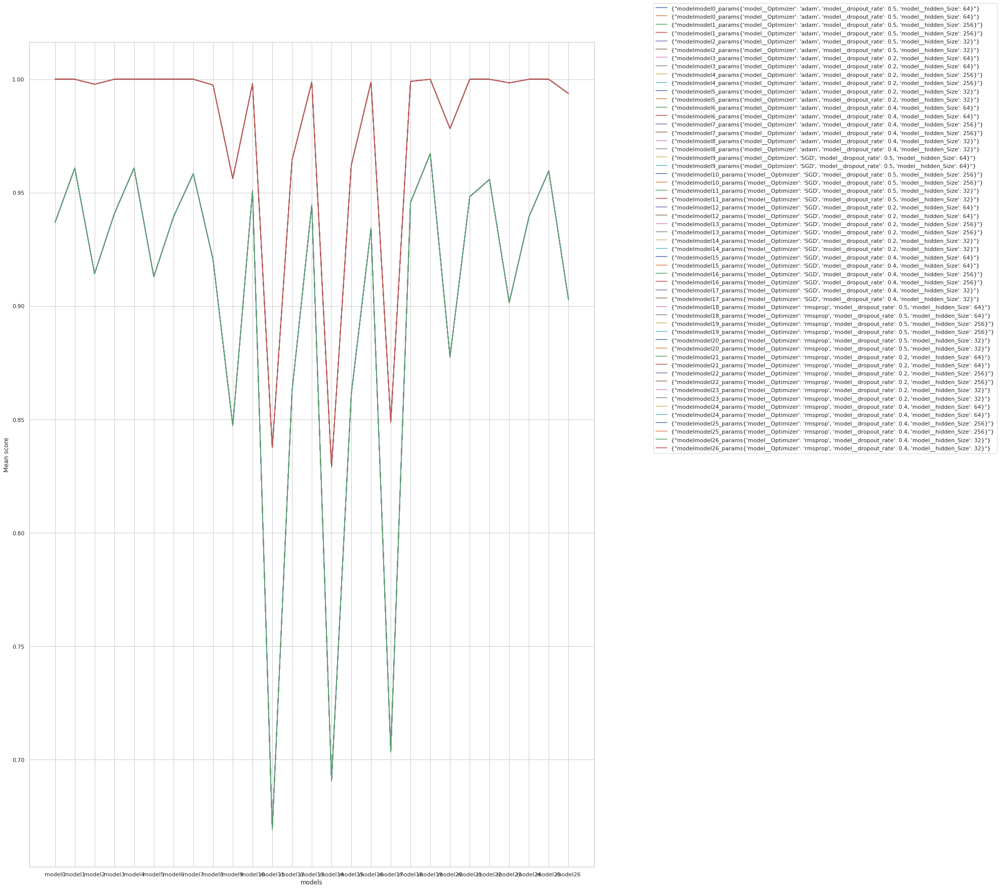

Fitting 5 folds for each of 27 candidates, totalling 135 fits


/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Epoch 1/50
25/25 [==============================] - 1s 6ms/step - loss: 3.7864 - accuracy: 0.1881
Epoch 2/50
25/25 [==============================] - 0s 4ms/step - loss: 2.2169 - accuracy: 0.6881
Epoch 3/50
25/25 [==============================] - 0s 7ms/step - loss: 1.4132 - accuracy: 0.8485
Epoch 4/50
25/25 [==============================] - 0s 4ms/step - loss: 0.8907 - accuracy: 0.9268
Epoch 5/50
25/25 [==============================] - 0s 3ms/step - loss: 0.5928 - accuracy: 0.9558
Epoch 6/50
25/25 [==============================] - 0s 3ms/step - loss: 0.4014 - accuracy: 0.9747
Epoch 7/50
25/25 [==============================] - 0s 4ms/step - loss: 0.2763 - accuracy: 0.9874
Epoch 8/50
25/25 [==============================] - 0s 3ms/step - loss: 0.1876 - accuracy: 0.9949
Epoch 9/50
25/25 [==============================] - 0s 3ms/step - loss: 0.1461 - accuracy: 0.9975
Epoch 10/50
25/25 [==============================] - 0s 3ms/step - loss: 0.0996 - accuracy: 0.9949
Epoch 11/50
25/25 [

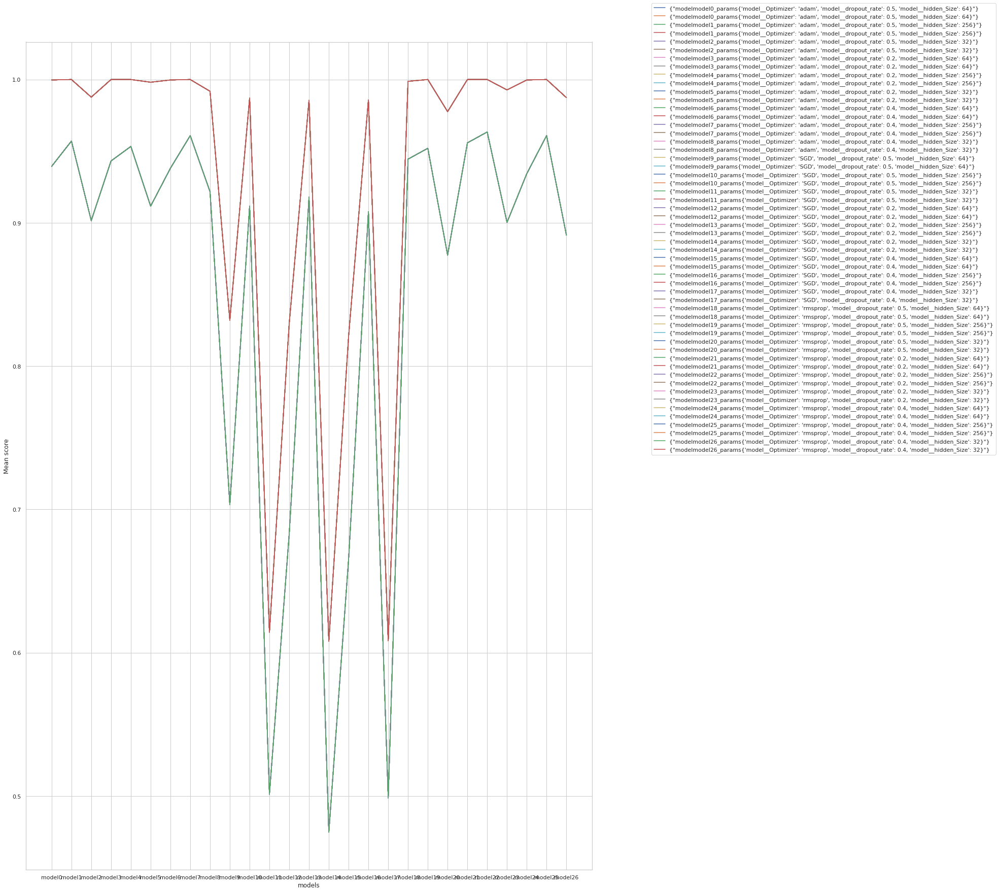

Fitting 5 folds for each of 27 candidates, totalling 135 fits


/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Epoch 1/50
13/13 [==============================] - 1s 6ms/step - loss: 4.1900 - accuracy: 0.0947
Epoch 2/50
13/13 [==============================] - 0s 6ms/step - loss: 2.8945 - accuracy: 0.4091
Epoch 3/50
13/13 [==============================] - 0s 6ms/step - loss: 2.1208 - accuracy: 0.6566
Epoch 4/50
13/13 [==============================] - 0s 6ms/step - loss: 1.6389 - accuracy: 0.7475
Epoch 5/50
13/13 [==============================] - 0s 8ms/step - loss: 1.2768 - accuracy: 0.8434
Epoch 6/50
13/13 [==============================] - 0s 5ms/step - loss: 0.9726 - accuracy: 0.9028
Epoch 7/50
13/13 [==============================] - 0s 5ms/step - loss: 0.7642 - accuracy: 0.9343
Epoch 8/50
13/13 [==============================] - 0s 7ms/step - loss: 0.6201 - accuracy: 0.9482
Epoch 9/50
13/13 [==============================] - 0s 5ms/step - loss: 0.5015 - accuracy: 0.9558
Epoch 10/50
13/13 [==============================] - 0s 5ms/step - loss: 0.3901 - accuracy: 0.9823
Epoch 11/50
13/13 [

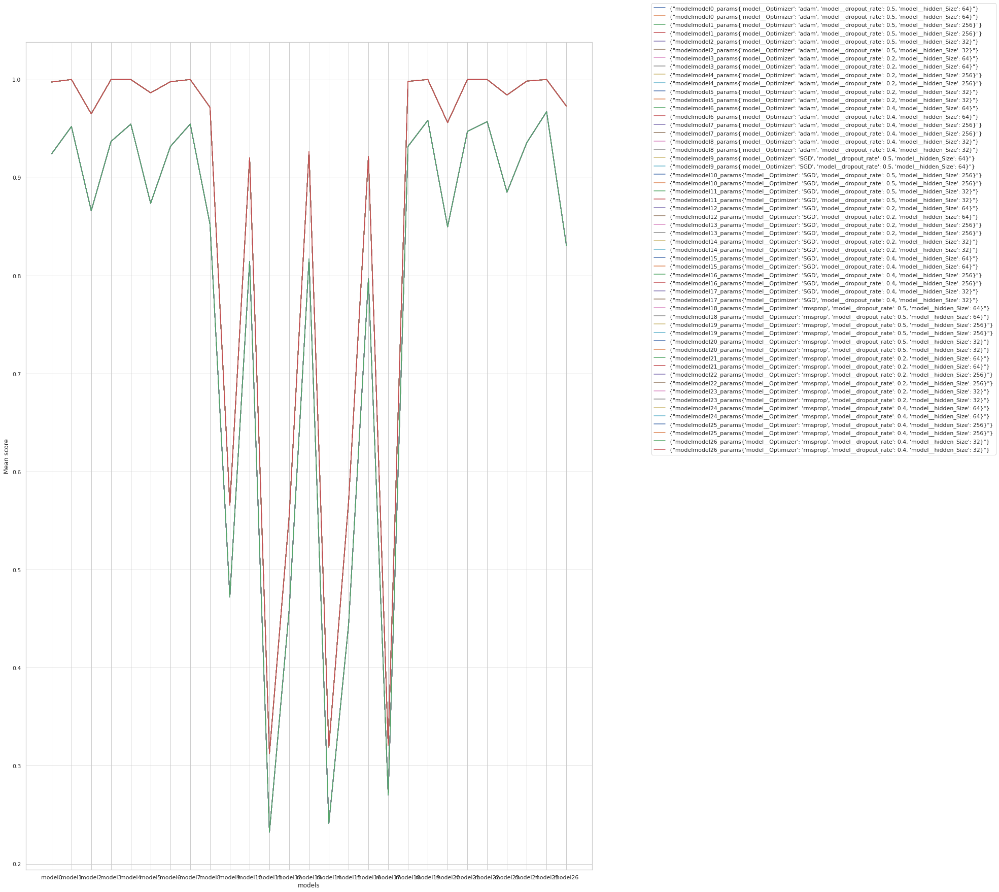

In [ ]:

save_models = []
grid_results_df = []
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

for i in range(len(bach_size_params)):
    # create model
    model = KerasClassifier(model=create_model, epochs= 50, batch_size=bach_size_params[i], callbacks=[callback])
    # define the grid search parameters
    param_grid = dict(model__hidden_Size=hidden_Size_params , model__dropout_rate=dropout_rate_params , model__Optimizer=Optimizer_params)
    grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=5 ,verbose=3 , return_train_score = True)
    grid_result = grid.fit(xTrain_scaled, yTrain)
    df_cv_results = pd.DataFrame(grid_result.cv_results_)
    grid_models = ["model{}".format(ind) for ind , params in enumerate(df_cv_results.params)]
    for ind , params in enumerate(df_cv_results.params):
        plt.plot(grid_models ,df_cv_results.mean_test_score , label = {"model{}_params{}".format(grid_models[ind],str(params))} )
        plt.plot(grid_models ,df_cv_results.mean_train_score , label = {"model{}_params{}".format(grid_models[ind],str(params))} )
    # changing the rc parameters and plotting a line plot
    plt.rcParams['figure.figsize'] = [20, 30]
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.xlabel('models')
    plt.ylabel('Mean score')
    plt.show()
    #########################
    # SAVE-LOAD using joblib #
    ##########################
    # save
    save_models.append(joblib.dump(grid_result, "model_{}.pk".format(bach_size_params[i])))
    grid_results_df.append(df_cv_results)



# Evaluate The best 3  models


---



---



13/13 [==============================] - 0s 2ms/step
____________________________________________________________________________________________________
Best Params:  {'model__Optimizer': 'rmsprop', 'model__dropout_rate': 0.5, 'model__hidden_Size': 256}
Accuracy Train:  1.0 

Accuracy Test:  0.9747474747474747 

classification_report of model_16
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         2
           8       1.00      1.00      1.00         2
           9       1.00      1.00      1.00         2
          10       0.75      1.00      0.86         3
  

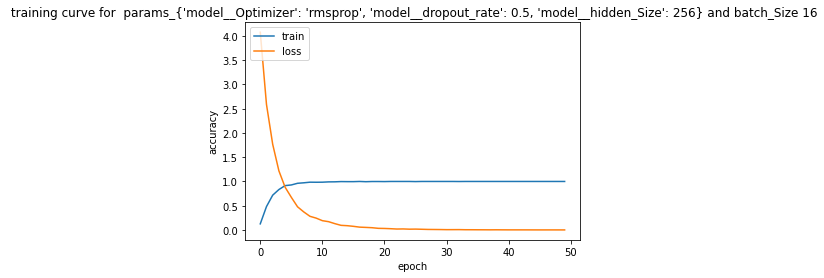

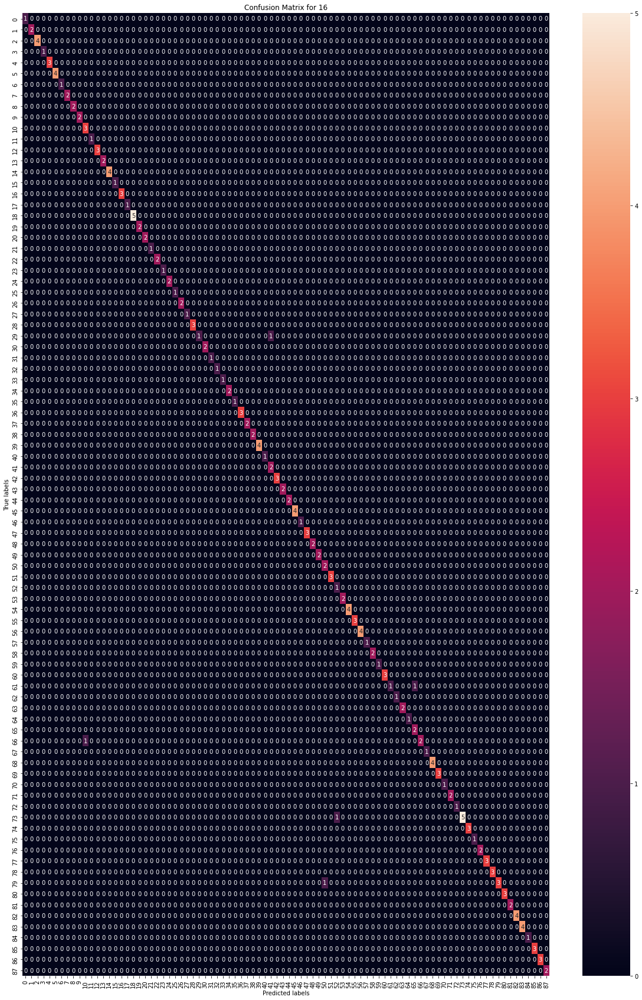

7/7 [==============================] - 0s 3ms/step
____________________________________________________________________________________________________
Best Params:  {'model__Optimizer': 'rmsprop', 'model__dropout_rate': 0.2, 'model__hidden_Size': 256}
Accuracy Train:  1.0 

Accuracy Test:  0.9696969696969697 

classification_report of model_32
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         2
           8       1.00      1.00      1.00         2
           9       1.00      1.00      1.00         2
          10       0.75      1.00      0.86         3
    

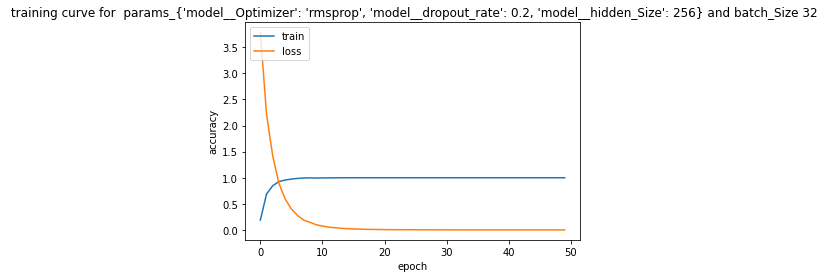

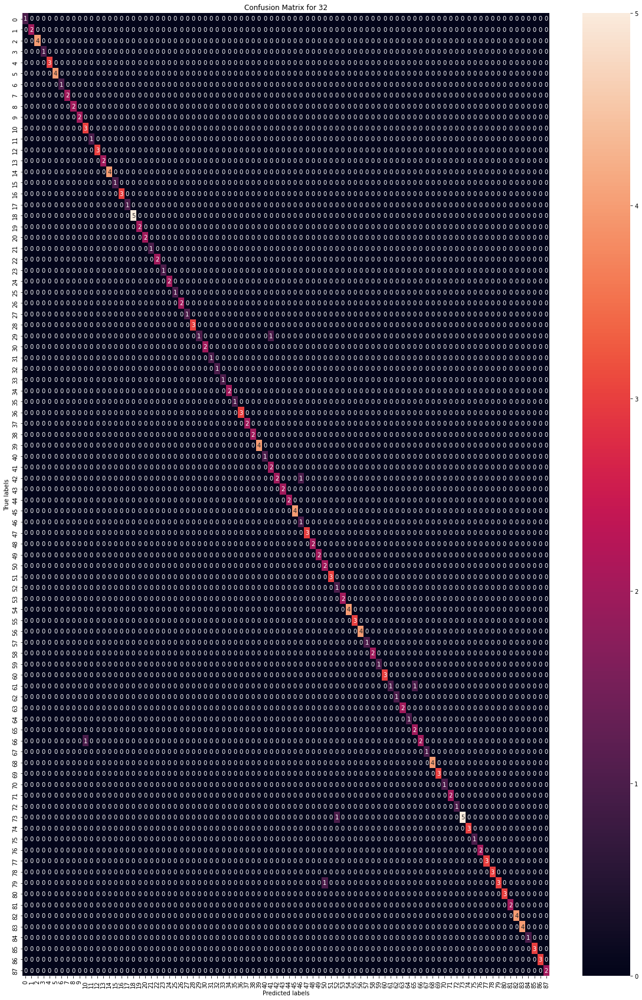

4/4 [==============================] - 0s 4ms/step
____________________________________________________________________________________________________
Best Params:  {'model__Optimizer': 'rmsprop', 'model__dropout_rate': 0.4, 'model__hidden_Size': 256}
Accuracy Train:  1.0 

Accuracy Test:  0.9646464646464646 

classification_report of model_64
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         2
           8       1.00      1.00      1.00         2
           9       1.00      1.00      1.00         2
          10       0.75      1.00      0.86         3
    

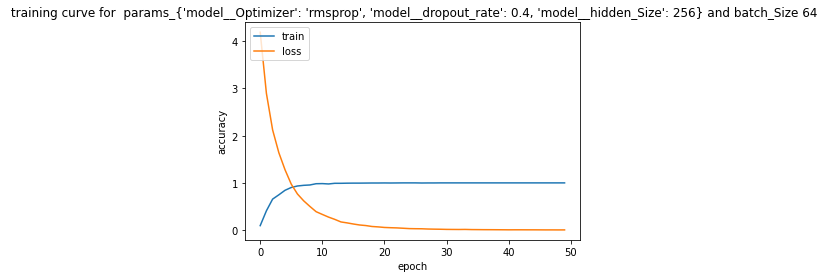

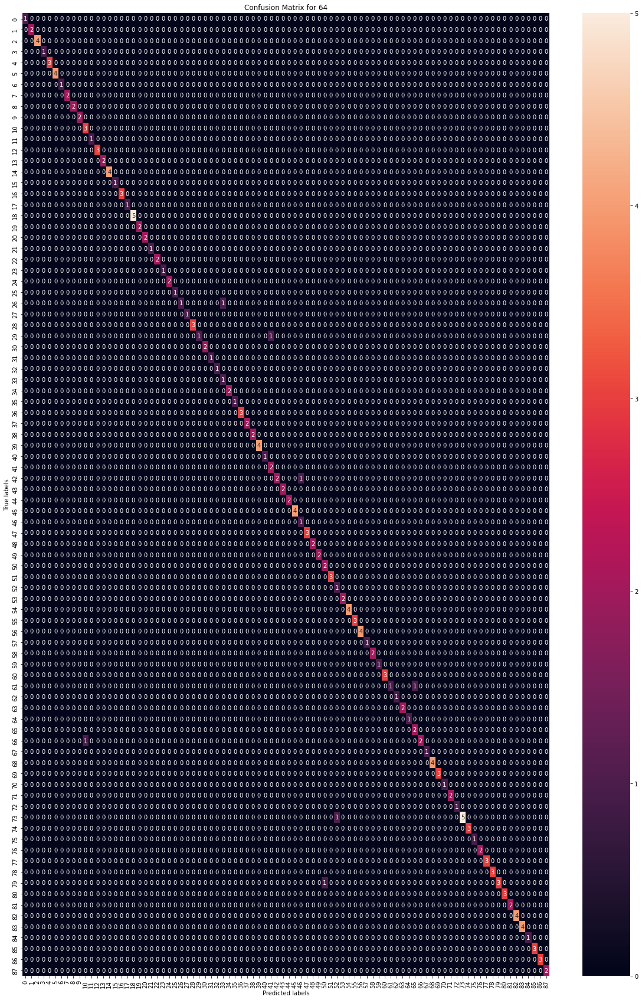

[[1.0,
  0.9747474747474747,
  {'model__Optimizer': 'rmsprop',
   'model__dropout_rate': 0.5,
   'model__hidden_Size': 256}],
 [1.0,
  0.9696969696969697,
  {'model__Optimizer': 'rmsprop',
   'model__dropout_rate': 0.2,
   'model__hidden_Size': 256}],
 [1.0,
  0.9646464646464646,
  {'model__Optimizer': 'rmsprop',
   'model__dropout_rate': 0.4,
   'model__hidden_Size': 256}]]

In [ ]:
bach_size_params = [16 , 32 , 64]
hidden_Size_params = [64 , 256, 32]
dropout_rate_params = [0.5 , 0.2, 0.4]
Optimizer_params = ['adam' , 'SGD', "rmsprop"]
def create_model(hidden_Size , dropout_rate , Optimizer):
    model = tf.keras.Sequential([
    tf.keras.Input(shape = (xTrain_scaled.shape[1],) ),
    tf.keras.layers.Dense(hidden_Size, activation='tanh'),
    tf.keras.layers.Dropout(dropout_rate),
    tf.keras.layers.Dense(99, activation='softmax')])
    model.compile(loss='sparse_categorical_crossentropy', optimizer= Optimizer, metrics=['accuracy'])
    return  model
def Evaluation(bach_size_params):
  evaluation_list_models = []
  for i in range(len(bach_size_params)):
      # load models
      model = joblib.load( "/content/model_{}.pk".format(bach_size_params[i]))

      y_pred_train = model.predict(xTrain_scaled)
      y_pred_val = model.predict(xTest_scaled)
      print('__'*50)
      print('Best Params: ', model.best_params_)
      acc_train= accuracy_score(yTrain, y_pred_train)
      acc_test= accuracy_score(yTest, y_pred_val)
      print('Accuracy Train: ',acc_train,'\n')
      print('Accuracy Test: ',acc_test,'\n')
    #  Plot Training Curve
      plt.plot(model.best_estimator_.history_['accuracy'])
      plt.plot(model.best_estimator_.history_['loss'])
      plt.title(" training curve for  params_{} and batch_Size {}".format(model.best_params_ ,bach_size_params[i] ))
      plt.ylabel('accuracy')
      plt.xlabel('epoch')
      plt.legend(['train', 'loss'], loc='upper left')
    # Print Classification Matrix
      report = classification_report(yTest, y_pred_val)
      print("classification_report of " +  "model_{}".format(bach_size_params[i]) )
      print(report)
      # Plot Confusion Matrix
      cm = confusion_matrix(yTest, y_pred_val)
      plt.figure(figsize=(20,30))
      sns.heatmap(cm, annot=True, fmt='g')
      # labels, title and ticks
      plt.xlabel('Predicted labels')
      plt.ylabel('True labels')
      plt.title('Confusion Matrix for {}'.format(bach_size_params[i]))
      plt.show()
      evaluation_list_models.append([acc_train, acc_test ,  model.best_params_])

  return evaluation_list_models

evaluation_list_models = Evaluation(bach_size_params)
evaluation_list_models

<Axes: xlabel='model'>

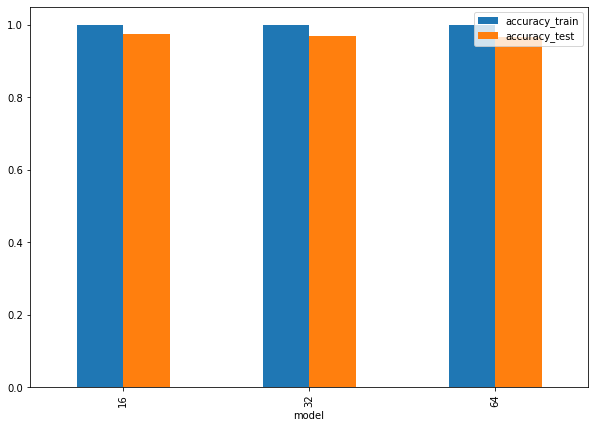

In [ ]:
column_names = ["model", "accuracy_train","accuracy_test" , "Parameter"]

Data = [[bach_size_params[i]]+evaluation_list_models[i] for i in range(len(evaluation_list_models))]

comparision_classifier = pd.DataFrame(Data , columns = column_names)

comparision_classifier.to_csv('comparision_classifier_balance_classes.csv')
comparision_classifier.plot(x='model',kind="bar",figsize=(10,7))

In [ ]:
comparision_classifier

,model,accuracy_train,accuracy_test,Parameter
0,16,1.0,0.974747,"{'model__Optimizer': 'rmsprop', 'model__dropou..."
1,32,1.0,0.969697,"{'model__Optimizer': 'rmsprop', 'model__dropou..."
2,64,1.0,0.964646,"{'model__Optimizer': 'rmsprop', 'model__dropou..."
